In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
import warnings
from PIL import Image, ImageChops
from sklearn.decomposition import PCA
warnings.filterwarnings('ignore', category=FutureWarning)
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LinearRegression
import csv
import cv2
import math
from sklearn.model_selection import cross_val_score

In [2]:
# Reusable variables
d_dpi = 500
d_color = "#4152ec"
colors = ['#292929', d_color, '#ffa30e', '#f43131', '#2ca02c', '#ed77db', "#8a32e3"]

# Data folder paths
image_folder = "../Photos_of_Faces3"
ratings_folder = "../data_ratings"

---
# **3. Pool the (normalised) rating data**
---

In [3]:
# List of .csv files in folder
ratings_csv_files = [f for f in os.listdir(ratings_folder) if f.endswith('.csv')]

## **Histogram for each participants**

In [4]:
max_freq = 0
for csv_file in ratings_csv_files:
    df = pd.read_csv(os.path.join(ratings_folder, csv_file))
    
    # Normalize ratings
    # df['rating'] = (df['rating'] - df['rating'].min()) / (df['rating'].max() - df['rating'].min())
    values, _ = np.histogram(df['rating'], bins=5)
    
    # Update max frequency
    if max_freq < values.max():
        max_freq = values.max()

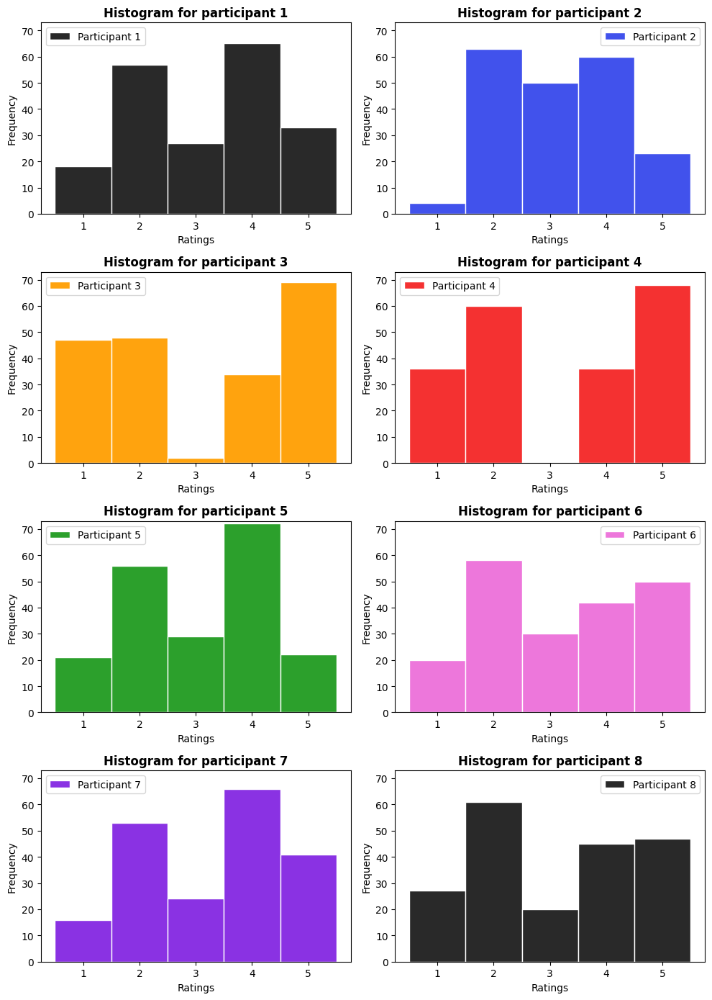

In [5]:
# Number of subplots needed
num_plots = len(ratings_csv_files)

# Number of rows for the subplot grid
num_rows = math.ceil(num_plots / 2)

fig, axs = plt.subplots(num_rows, 2, figsize=(10, num_rows*3.5))

# Hide all subplots initially
for ax in axs.flat:
    ax.axis('off')

for i, csv_file in enumerate(ratings_csv_files):
    # Calculate the row and column index for the subplot
    row = i // 2
    col = i % 2
    
    # If there is an odd number of plots and this is the last one, keep it on the left by keeping col as 0.
    if num_plots % 2 == 1 and i == num_plots - 1:
        col = 0

    # Check if axs is 1-dimensional and adjust indexing accordingly
    if axs.ndim == 1:
        ax = axs[i]
    else:
        ax = axs[row, col]

    ax.axis('on')  # Make this subplot visible

    df = pd.read_csv(os.path.join(ratings_folder, csv_file))
    
    # Normalize ratings if the full range of the rating scale is not used
    # df['rating'].interpolate(inplace=True)
    # df['rating'] = (df['rating'] - df['rating'].min()) / (df['rating'].max() - df['rating'].min())
    
    # Create histogram with dynamic bins based on 'rating' column
    min_rating = df['rating'].min() - 0.5
    max_rating = df['rating'].max() + 0.5
    bins = np.arange(min_rating, max_rating+1)
    
    ax.hist(df['rating'], bins=bins, color=colors[i % len(colors)], edgecolor='white', linewidth=1)
    
    # Title
    participant_id = df['id'].iloc[0]+1
    ax.set_title(f'Histogram for participant {participant_id}', weight='bold')
    ax.legend([f'Participant {participant_id}'])
    ax.set_xlabel('Ratings')
    ax.set_ylabel('Frequency')
    ax.set_ylim(0, max_freq+1)

plt.subplots_adjust(hspace=0.5)
plt.tight_layout()
plt.show()


## **Stacked bar plot of the ratings**

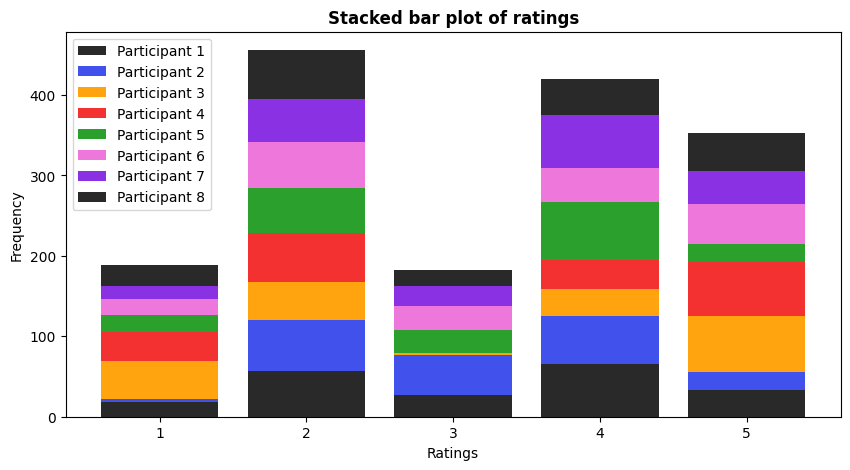

In [6]:
plt.figure(figsize=(10, 5))

all_ratings = [[] for _ in range(len(ratings_csv_files))]  # One list for each participant

for i, csv_file in enumerate(ratings_csv_files):
    df = pd.read_csv(os.path.join(ratings_folder, csv_file))

    # Add ratings to the corresponding list
    all_ratings[i].extend(df['rating'].values.tolist())

# Create labels for each participant
labels = [f'Participant {i+1}' for i in range(len(ratings_csv_files))]

# Stacked bar plot
bins = range(1, 7)
bin_centers = [(bins[i] + bins[i+1]) / 2 for i in range(len(bins)-1)]  # Calculate bin centers

# Calculate cumulative histogram
cumulative_hist = np.zeros(len(bin_centers))

for i, ratings in enumerate(all_ratings):
    hist, _ = np.histogram(ratings, bins=bins)
    
    # Plot bars one at a time
    for j in range(len(hist)):
        plt.bar(bin_centers[j], hist[j], bottom=cumulative_hist[j], label=labels[i] if j == 0 else "", color=colors[i % len(colors)], width=0.8)
        cumulative_hist[j] += hist[j]  # Update cumulative histogram

plt.title("Stacked bar plot of ratings", weight='bold')
plt.xlabel('Ratings')
plt.ylabel('Frequency')

# Adjust x-ticks and their labels to be centered
plt.xticks(bin_centers, bins[:-1])

plt.legend()
plt.show()


## **Investigating the feminine/masculine stacks**

In [7]:
sum_bars_1_and_2 = 0
sum_bars_4_and_5 = 0

for ratings in all_ratings:
    hist, _ = np.histogram(ratings, bins=bins)
    sum_bars_1_and_2 += hist[0] + hist[1]
    sum_bars_4_and_5 += hist[3] + hist[4]

print("Sum of bars 1 and 2:", sum_bars_1_and_2)
print("Sum of bars 4 and 5:", sum_bars_4_and_5)


Sum of bars 1 and 2: 645
Sum of bars 4 and 5: 773


---
# **4. PCA and dimension reduction**
---

In [35]:
import pandas as pd
import os

# Define the path to the folder containing the CSV files
csv_folder = "../data_ratings"

# Define the path to the folder containing the images
image_folder = "../Photos_of_Faces3"

# Initialize lists to store images and ratings
all_images = []
all_ratings = []

# Iterate through CSV files in the folder
for csv_file in os.listdir(csv_folder):
    if csv_file.endswith('.csv'):
        csv_path = os.path.join(csv_folder, csv_file)

        # Read the CSV file into a DataFrame
        df = pd.read_csv(csv_path)

        # Initialize lists to store images and ratings for this CSV file
        images = []
        ratings = []

        # Iterate through the CSV column and read images
        for image_filename in df['image_name']:
            image_path = os.path.join(image_folder, image_filename)

            # Read the image using OpenCV
            image = np.array(Image.open((image_path)))

            if image is not None:
                # Append the image to the images list
                images.append(image)

                # Append the corresponding rating (replace 'rating' with the actual rating column name)
                ratings.append(df.loc[df['image_name'] == image_filename, 'rating'].values[0])

        # Append the images and ratings for this CSV file to the overall lists
        all_images.extend(images)
        all_ratings.extend(ratings)

# Now, 'all_images' contains all the images from all CSV files, and 'all_ratings' contains their corresponding ratings.


In [8]:
# Get a list of all image files in the folder
'''image_files = os.listdir(image_folder)
images = [np.array(Image.open(os.path.join(image_folder, img))) for img in image_files]
images_flattened = [img.flatten() for img in images]'''

In [36]:
images_flattened = [img.flatten() for img in all_images]

## **Mean image**

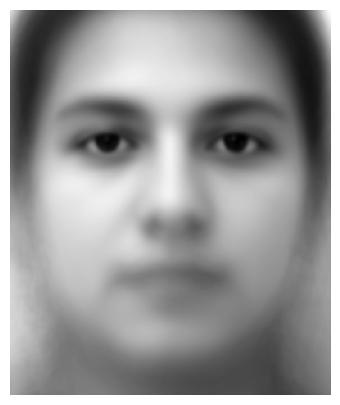

In [37]:
# Subtract mean image
mean_image = np.mean(images_flattened, axis=0)
images_subtracted = images_flattened - mean_image

# Reshape the mean image to its original size
mean_image_reshaped = mean_image.reshape(images[0].shape)

# Plot the mean image
plt.figure(figsize=(5, 5))
plt.imshow(mean_image_reshaped, cmap="gray")
# plt.title("Mean Image")
plt.axis("off")
plt.show()

## **PCA**

In [39]:
pca = PCA()
scores = pca.fit_transform(images_subtracted)

### **10 first PCs**

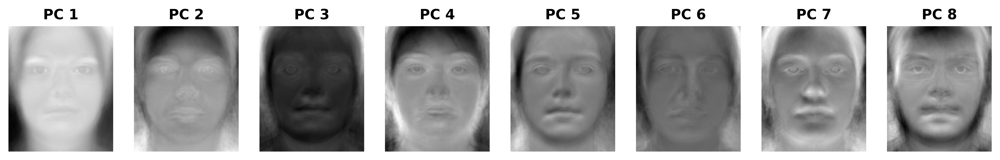

In [40]:
# Number of components to display
num_components = 8

# Figure
fig, axs = plt.subplots(1, num_components, figsize=(15, 5), dpi=d_dpi)

for i in range(num_components):
    # Get the i-th principal component
    component = pca.components_[i]

    # Reshape the component to the original image shape
    component_image = component.reshape(images[0].shape)

    # Plot the component as an image
    axs[i].imshow(component_image, cmap='gray')
    axs[i].set_title(f'PC {i+1}', weight='bold')
    axs[i].axis('off')

plt.show()

### **PCs and their image for max/min score**

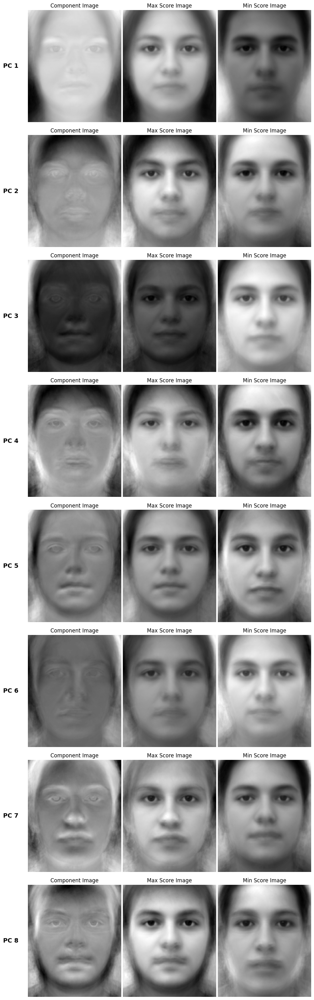

In [41]:
def plot_image(ax, image, title):
    ax.imshow(image, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

def get_component_image(pca, component_index, image_shape):
    component = pca.components_[component_index]
    component_image = component.reshape(image_shape)
    return component_image

def get_score_image(pca, scores, component_index):
    max_score_image = np.max(scores[:,component_index])*np.array(pca.components_[component_index]) + np.array(mean_image)
    min_score_image = np.min(scores[:,component_index])*np.array(pca.components_[component_index]) + np.array(mean_image)
    return max_score_image, min_score_image


# Number of components to display
num_components = 8

# Figure
fig, axs = plt.subplots(num_components, 3, figsize=(10, num_components*4))

# For each of the first few components
for i in range(num_components):
    component_image = get_component_image(pca, i, images[0].shape)
    max_score_image, min_score_image = get_score_image(pca, scores, i)

    # Add a subtitle for the row with larger font size and bold font
    axs[i, 0].text(-0.1, 0.5, f'PC {i+1}', fontsize=14, weight='bold', va='center', ha='right', transform=axs[i, 0].transAxes)  # Increase the padding and font size

    plot_image(axs[i, 0], component_image.reshape(images[0].shape), 'Component Image')
    plot_image(axs[i, 1], max_score_image.reshape(images[0].shape), 'Max Score Image')
    plot_image(axs[i, 2], min_score_image.reshape(images[0].shape), 'Min Score Image')

plt.tight_layout()
plt.show()

### **Comparing the Mean image with the max/min score image**

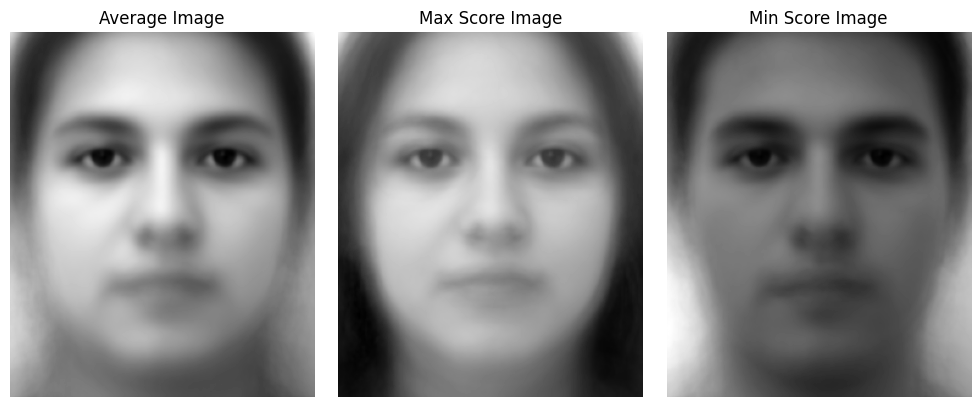

In [42]:
fig, axs = plt.subplots(1, 3, figsize=(10, 4))

mean_image = np.mean(images_flattened, axis=0)
max_score_image, min_score_image = get_score_image(pca, scores, 0)

# Plot the mean, max/min image
plot_image(axs[0], mean_image.reshape(images[0].shape), 'Average Image')
plot_image(axs[1], max_score_image.reshape(images[0].shape), 'Max Score Image')
plot_image(axs[2], min_score_image.reshape(images[0].shape), 'Min Score Image')

plt.tight_layout()
plt.show()


## **Bar plot of the variance explained for all the PCs**

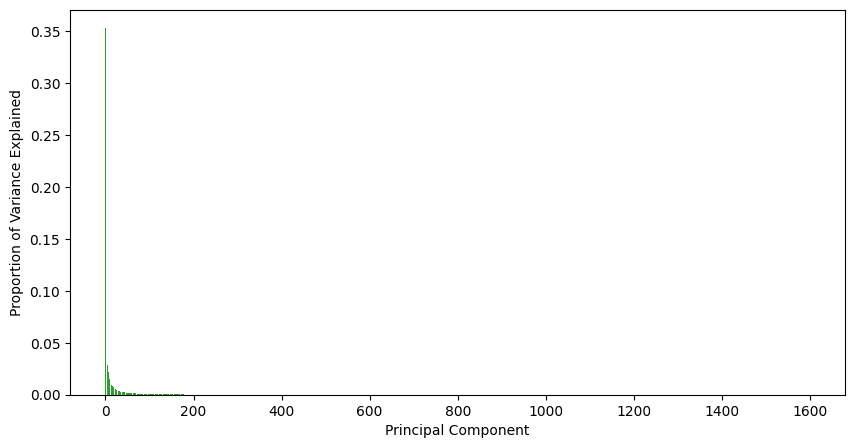

In [43]:
# Explained variance
explained_variance = pca.explained_variance_ratio_

plt.figure(figsize=(10, 5))
plt.bar(range(len(explained_variance)), explained_variance, color=colors[4])
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.show()

## **Finding the number of components (reduced dimension)**

In [44]:
# Calculate the cumulative explained variance
cumulative_explained_variance = np.cumsum(explained_variance)

# Define the threshold for the cumulative explained variance
variance_threshold = 0.9

# Find the number of PCs that meet the threshold
num_components = np.where(cumulative_explained_variance > variance_threshold)[0][0] + 1

print(f"Number of components needed to explain {variance_threshold*100}% of variance: {num_components}")


Number of components needed to explain 90.0% of variance: 46


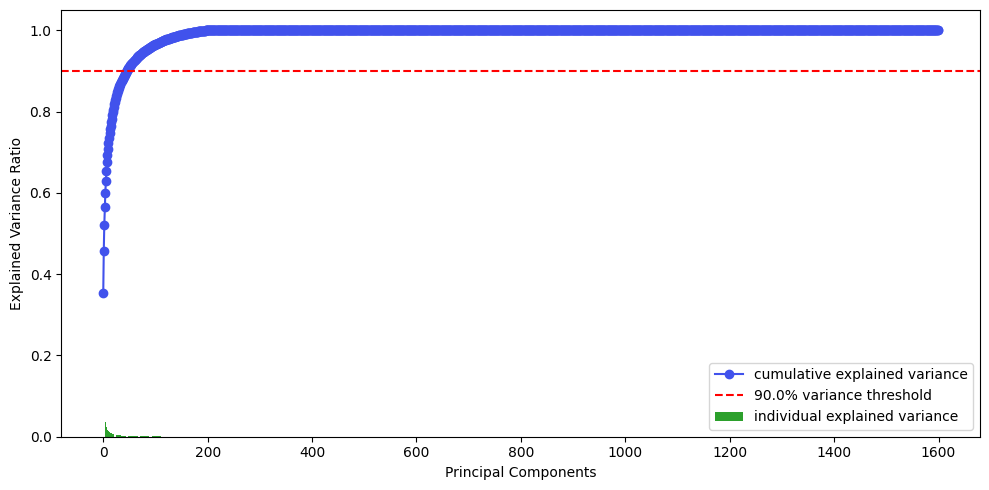

In [45]:
fig, ax1 = plt.subplots(figsize=(10, 5))

# Individual explained variance
ax1.bar(range(len(explained_variance)), explained_variance,
        align='center', label='individual explained variance', color=colors[4])

# Cumulative explained variance
ax1.plot(range(len(cumulative_explained_variance)), cumulative_explained_variance,
         marker='o', linestyle='-', label='cumulative explained variance', color=d_color)

# Threshold
ax1.axhline(y=variance_threshold, color='r', linestyle='--', label=f'{variance_threshold*100}% variance threshold')

# Add labels and title
ax1.set_xlabel('Principal Components')
ax1.set_ylabel('Explained Variance Ratio')
# plt.title('Explained Variance by Principal Components')

ax1.legend(loc='best')
plt.tight_layout()
plt.show()


---
# **5. Build a linear regression model that predicts the (normalised) ratings from the selected PC scores**
---

## **Get the scores for the new components**

In [46]:
sorted_components = np.argsort(pca.explained_variance_ratio_)[::-1]
top_components = sorted_components[:num_components]
scores = pca.transform(images_subtracted)[:, top_components]

## **Linear regression - forward selection**

In [48]:
ratings = all_ratings

In [49]:
model = LinearRegression()

# Sequential Feature Selector object
sfs = SequentialFeatureSelector(model, n_features_to_select='auto',tol=1e-4, direction='forward')

# Fit the SFS to the entire data
sfs.fit(scores, ratings)

# Transform the data to the selected features
scores_sfs = sfs.transform(scores)

# Perform X-fold cross-validation
scores_cv = cross_val_score(model, scores_sfs, ratings, cv=7)

print(f'Cross-validated scores: {scores_cv}')


Cross-validated scores: [0.63691851 0.60860368 0.6683972  0.69890261 0.70143032 0.52699346
 0.65557032]


## **Selected features**

In [50]:
# Get the indices of the selected features
selected_features = sfs.get_support(indices=True)
n_selected_features = len(selected_features)

print("Number of selected features:", n_selected_features)
print("The specific selected PCs are:", selected_features+1)

Number of selected features: 34
The specific selected PCs are: [ 1  2  3  4  5  6  7  8 10 11 12 16 17 18 19 21 22 23 24 25 26 28 30 31
 32 33 34 36 37 38 39 41 42 44]


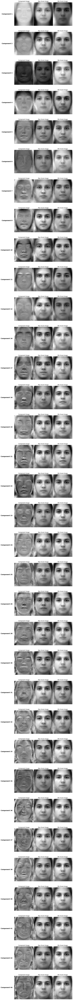

In [51]:
fig, axs = plt.subplots(len(selected_features), 3, figsize=(10, len(selected_features)*4))

# For each of the selected components
for i, idx in enumerate(selected_features):
    component_image = get_component_image(pca, idx, images[0].shape)
    max_score_image, min_score_image = get_score_image(pca, scores, idx)
    
    # Add a subtitle for the row
    axs[i, 0].text(-0.1, 0.5, f'Component {idx+1}', fontsize=14, weight='bold', va='center', ha='right', transform=axs[i, 0].transAxes)
    
    plot_image(axs[i, 0], component_image.reshape(images[0].shape), f'Component Image')
    plot_image(axs[i, 1], max_score_image.reshape(images[0].shape), f'Max Score Image')
    plot_image(axs[i, 2], min_score_image.reshape(images[0].shape), f'Min Score Image')

plt.tight_layout()
plt.show()


## **Parameters**

In [52]:
model.fit(scores_sfs, ratings)

# Get the parameters of the fitted model
coefficients = model.coef_
intercept = model.intercept_
print("Coefficients:", coefficients)
print("Intercept:", intercept)

Coefficients: [-1.83571020e-04  1.37118419e-05 -9.18147407e-05 -9.23300732e-05
 -1.53364047e-05 -4.74736847e-05 -9.32742224e-05  7.64295630e-05
  1.18324089e-04  2.42372816e-04 -6.16989884e-05  1.09847025e-04
  1.72472851e-04  6.07350503e-05  1.45485815e-04  3.48460812e-04
 -5.28803749e-05  1.66015268e-04  9.12031373e-05  2.82232885e-05
  1.44777385e-04  6.47246441e-05 -1.61131181e-04  2.68227644e-04
  8.42344696e-05  1.20201185e-04 -1.16169839e-04 -1.81482306e-04
  1.18431958e-04 -1.00831142e-04  3.13797775e-04  7.74941941e-05
 -9.31479941e-05  7.57349826e-05]
Intercept: 3.1825


---
# **6. Generate synthetic images from the model**
---

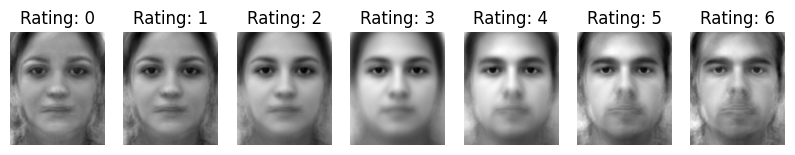

In [57]:
def generate_synthetic_image(w, delta, x0):
    alpha = (x0 - delta) / np.linalg.norm(w)**2
    i0 = alpha * w 
    return i0

# Rating scale
rating_scale = np.linspace(df['rating'].min() - 1, df['rating'].max() + 1, num=7)

w = model.coef_
delta = model.intercept_
Vt = pca.components_[selected_features]

# Generate synthetic image in reduced-dimensionality space
synthetic_images_reduced = [generate_synthetic_image(w, delta, x0) for x0 in rating_scale]

# Transform synthetic images back to original space
synthetic_images = [(np.dot(img, Vt)+mean_image) for img in synthetic_images_reduced]

# Plot
plt.figure(figsize=(10, 5))
for i, img in enumerate(synthetic_images):
    plt.subplot(1, len(rating_scale), i+1)
    plt.imshow(img.reshape(images[0].shape), cmap='gray')
    plt.title(f'Rating: {int(rating_scale[i])}')
    plt.axis('off')
plt.show()
